## Masked Autoencoders: Visualization Demo

This is a visualization demo using our pre-trained MAE models. No GPU is needed.

### Prepare
Check environment. Install packages if in Colab.


In [1]:
print('meow')

meow


In [2]:
import sys
import os
import requests

import torch
import numpy as np

import matplotlib.pyplot as plt
from PIL import Image

# check whether run in Colab
if 'google.colab' in sys.modules:
    print('Running in Colab.')
    !pip3 install timm==0.4.5  # 0.3.2 does not work in Colab
    !git clone https://github.com/facebookresearch/mae.git
    sys.path.append('./mae')
else:
    sys.path.append('..')
import models_mae

### Define utils

In [3]:
# define the utils

# imagenet_mean = np.array([0, 0, 0])
# imagenet_std = np.array([1, 1, 1])

imagenet_mean=np.array([0.485, 0.456, 0.406])
imagenet_std=np.array([0.229, 0.224, 0.225])

emoji_mean = np.array([238, 234, 231])
emoji_std = np.array([50, 53, 62])

def show_image(image, title=''):
    # image is [H, W, 3]
    assert image.shape[2] == 3
    plt.imshow(torch.clip((image * emoji_std + emoji_mean), 0, 255).int())
    plt.title(title, fontsize=16)
    plt.axis('off')
    return

def prepare_model(chkpt_dir, arch='mae_vit_large_patch16'):
    # build model
    model = getattr(models_mae, arch)()
    # load model
    checkpoint = torch.load(chkpt_dir, map_location='cpu')
    if 'model' in checkpoint:
        checkpoint = checkpoint['model']
    msg = model.load_state_dict(checkpoint, strict=False)
    print(msg)
    return model

def run_one_image(img, model, mask_ratio=0.75, force_mask=None):
    x = torch.tensor(img)

    # make it a batch-like
    x = x.unsqueeze(dim=0)
    #x = torch.einsum('nhwc->nchw', x)

    # run MAE
    loss, y, mask = model(x.float(), mask_ratio=mask_ratio, force_mask=force_mask)
    y = model.unpatchify(y)
    y = torch.einsum('nchw->nhwc', y).detach().cpu()

    # visualize the mask
    mask = mask.detach()
    mask = mask.unsqueeze(-1).repeat(1, 1, model.patch_embed.patch_size[0]**2 *3)  # (N, H*W, p*p*3)
    mask = model.unpatchify(mask)  # 1 is removing, 0 is keeping
    mask = torch.einsum('nchw->nhwc', mask).detach().cpu()

    x = torch.einsum('nchw->nhwc', x).detach().cpu()

    # masked image
    im_masked = x * (1 - mask)

    # MAE reconstruction pasted with visible patches
    im_paste = x * (1 - mask) + y * mask

    # make the plt figure larger
    plt.rcParams['figure.figsize'] = [24, 24]

    plt.subplot(1, 4, 1)
    show_image(x[0], "original")

    plt.subplot(1, 4, 2)
    show_image(im_masked[0], "masked")

    plt.subplot(1, 4, 3)
    show_image(y[0], "reconstruction")

    plt.subplot(1, 4, 4)
    show_image(im_paste[0], "reconstruction + visible")

    plt.show()

### Load an image

In [4]:
from dataset_generation.emoji_dataset import EmojiDataset
from torchvision import datasets, transforms
# simple augmentation
transform_test = transforms.Compose([
        # lambda img: transforms.functional.rotate(img, -90),
        # lambda img: transforms.functional.hflip(img),
        # transforms.Grayscale(num_output_channels=3),
        #transforms.RandomResizedCrop((224, 224), scale=(0.8, 1), interpolation=3),  # 3 is bicubic
        #transforms.RandomHorizontalFlip(),
        # transforms.RandomAffine(degrees=(-30, 30), translate=(0.5, 0.5), 
        #                         scale=(0.8, 1.2), shear=(-15, 15), interpolation=3),
        transforms.Resize((224, 224), interpolation=3),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
# dataset2 = datasets.CIFAR100('../data', train=True, download=True,
#                        transform=transform_test)
dataset2 = EmojiDataset('/home/gabe/uncertainty_mae/dataset_generation/columbia_emoji/val', keywords=['person'])
test_kwargs = {'batch_size': 1}
test_loader = torch.utils.data.DataLoader(dataset2, **test_kwargs)

100%|██████████| 492/492 [00:00<00:00, 25884.60it/s]


0
torch.Size([1, 3, 224, 224])
1
torch.Size([1, 3, 224, 224])
2
torch.Size([1, 3, 224, 224])
3
torch.Size([1, 3, 224, 224])


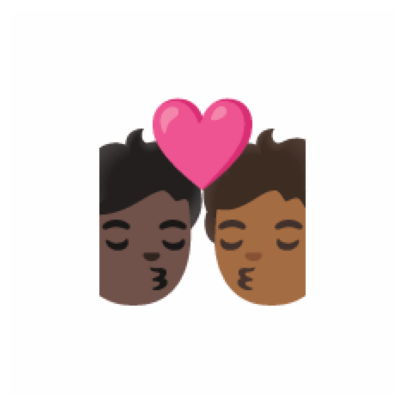

In [5]:
for idx, img_tuple in enumerate(test_loader):
    print(idx)
    plt.rcParams['figure.figsize'] = [5, 5]
    img, label = img_tuple
    print(img.shape)
    assert img.shape == (1, 3, 224, 224)
    img = img.squeeze()
    show_image(torch.einsum('chw->hwc', img))
    if idx == 3:
        break

### Load a pre-trained MAE model

In [6]:
# Thanks ChatGPT!

def load_decoder_state_dict(model, chkpt_dir):
    state_dict = torch.load(chkpt_dir)['model']
    # Filter the state_dict to include only the keys for the desired parameters
    filtered_state_dict = {k: v for k, v in state_dict.items() if k.startswith((
        'decoder_embed',
        'mask_token',
        'decoder_pos_embed',
        'decoder_blocks',
        'decoder_norm',
        'decoder_pred'
    ))}

    # Load the filtered state_dict into the model
    # Set strict=False to ignore non-matching keys
    model.load_state_dict(filtered_state_dict, strict=False)

    print('loaded decoder')

In [7]:
# This is an MAE model trained with pixels as targets for visualization (ViT-Large, training mask ratio=0.75)

# download checkpoint if not exist
!wget -nc https://dl.fbaipublicfiles.com/mae/visualize/mae_visualize_vit_base.pth

chkpt_dir = '/home/gabe/uncertainty_mae/emoji_train_longer/checkpoint-7999.pth'
model_mae = prepare_model(chkpt_dir, 'mae_vit_base_patch16')
print('Model loaded.')

# chkpt_dir = '/home/gabeguo/uncertainty_mae/cifar100_train/checkpoint-399.pth'
# model_mae = prepare_model(chkpt_dir, 'mae_vit_base_patch16')
# print('Model loaded.')

# lower_dir = '/home/gabeguo/uncertainty_mae/cifar100_quantile/lower_bound_checkpoint-45.pt'
# lower_model = prepare_model(lower_dir, 'mae_vit_base_patch16')
# load_decoder_state_dict(lower_model, chkpt_dir)


# upper_dir = '/home/gabeguo/uncertainty_mae/cifar100_quantile/upper_bound_checkpoint-45.pt'
# upper_model = prepare_model(lower_dir, 'mae_vit_base_patch16')
# load_decoder_state_dict(upper_model, chkpt_dir)

# print('Bounds loaded')

File ‘mae_visualize_vit_base.pth’ already there; not retrieving.

<All keys matched successfully>
Model loaded.


### Run MAE on the image

MaskedAutoencoderViT(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  )
  (blocks): ModuleList(
    (0-11): 12 x Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (drop_path): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=3072, out_features=768, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
    )
  )
  (norm): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
  (decoder_embed): Linear(in_features=768, out_features=512, bias=

/tmp/ipykernel_2077935/1461678595.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(img)


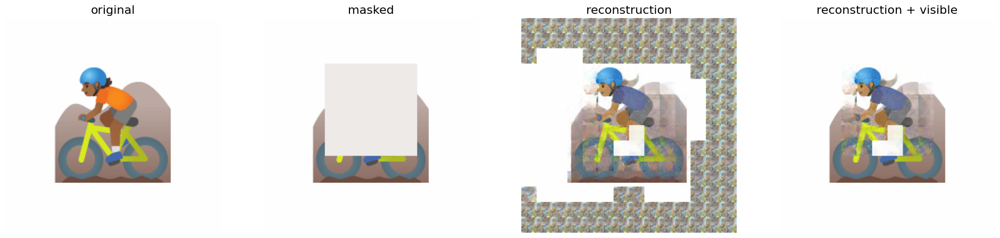

1
run regular


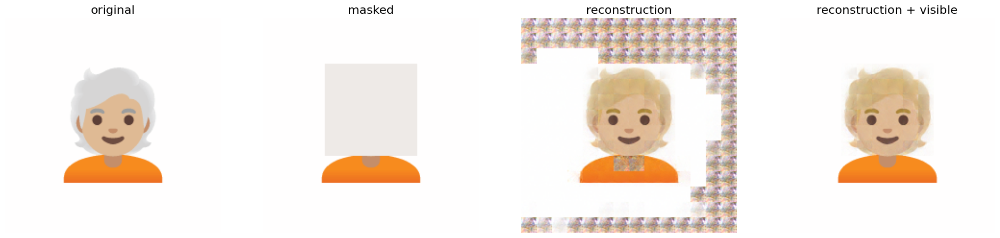

2
run regular


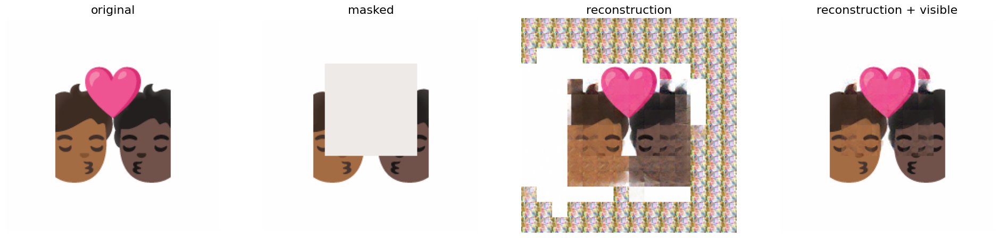

3
run regular


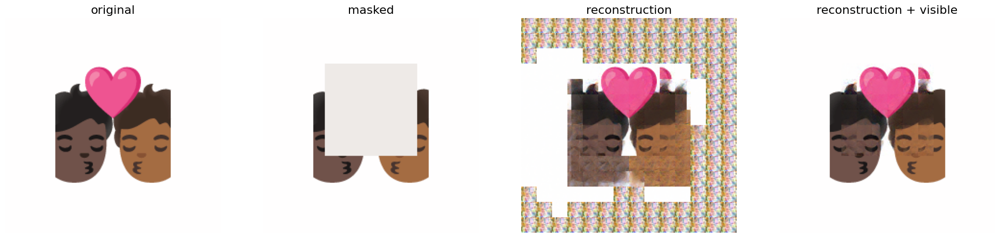

4
run regular


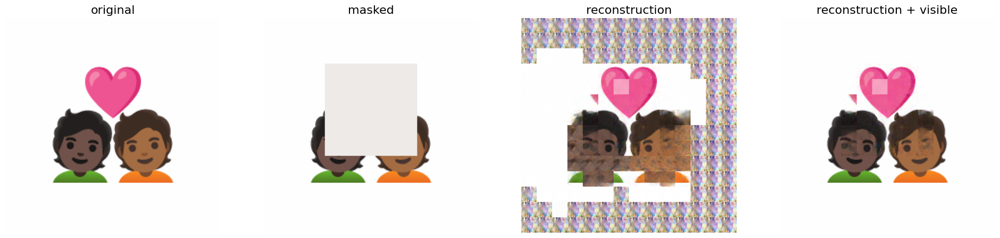

5
run regular


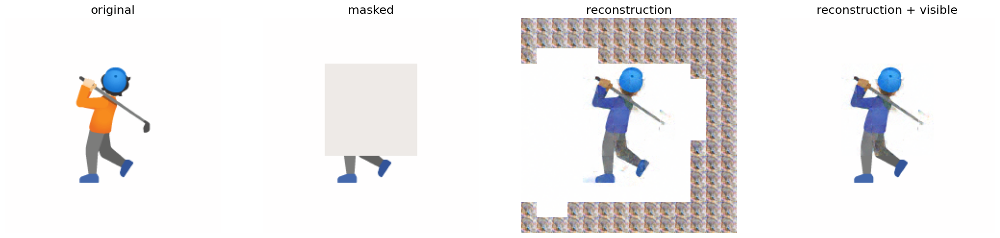

6
run regular


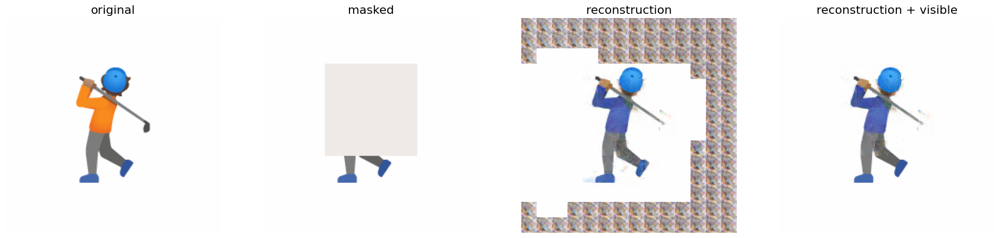

7
run regular


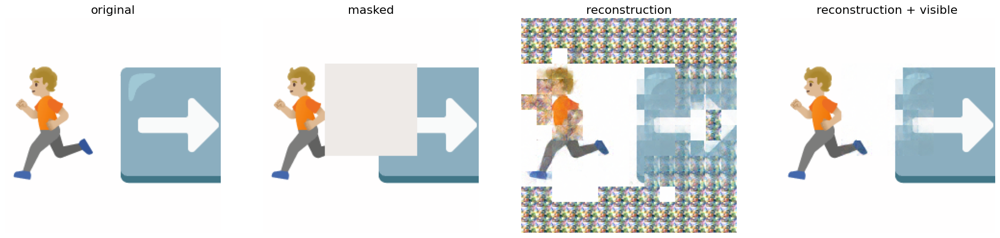

8
run regular


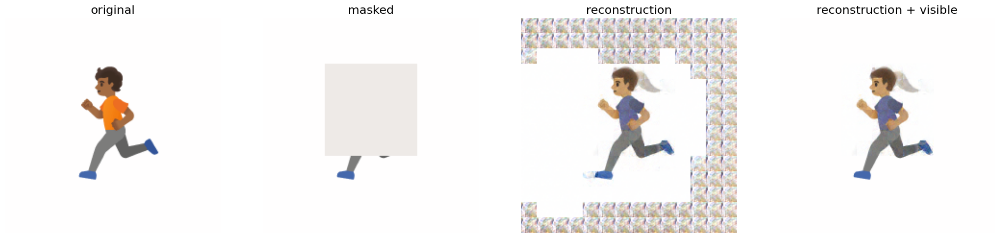

9
run regular


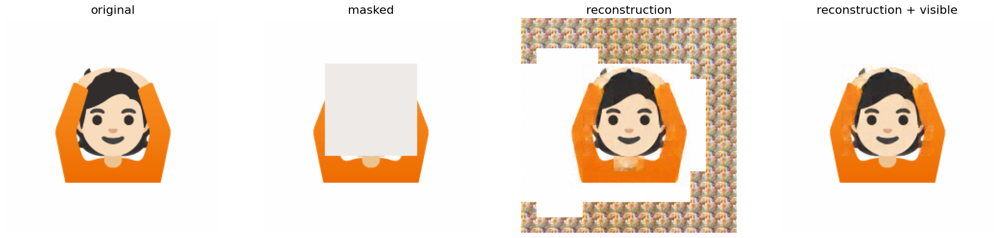

10
run regular


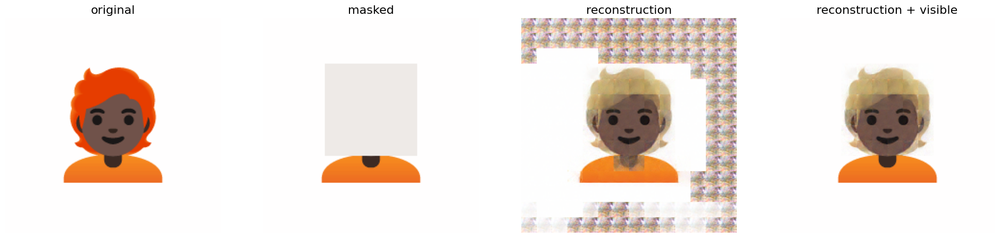

11
run regular


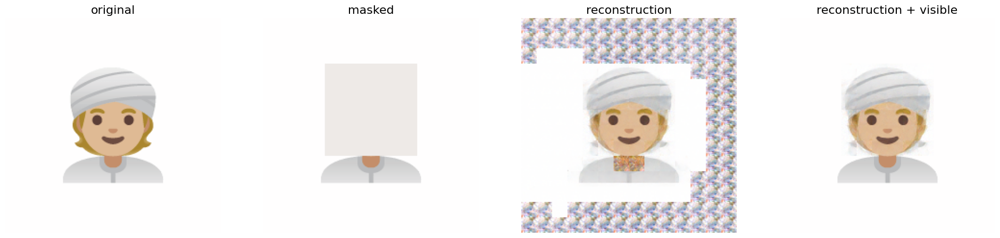

12
run regular


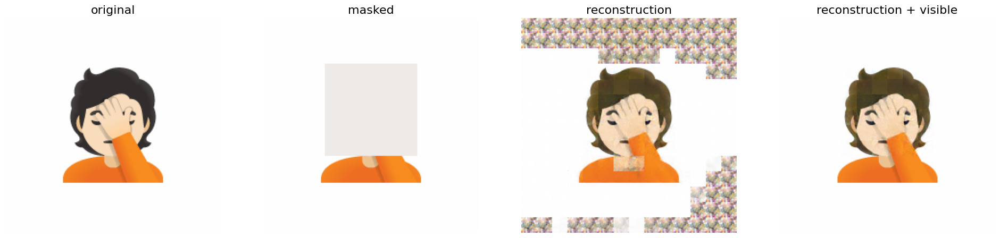

13
run regular


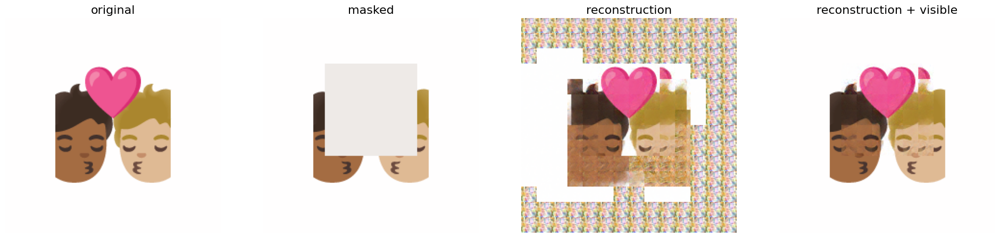

14
run regular


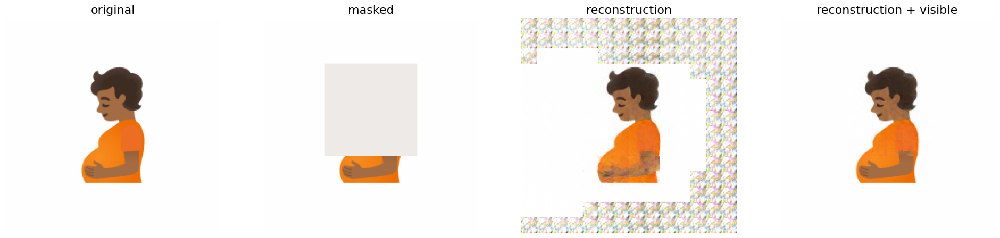

15
run regular


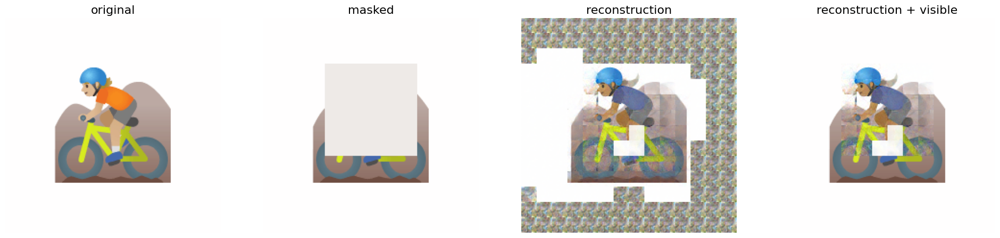

16
run regular


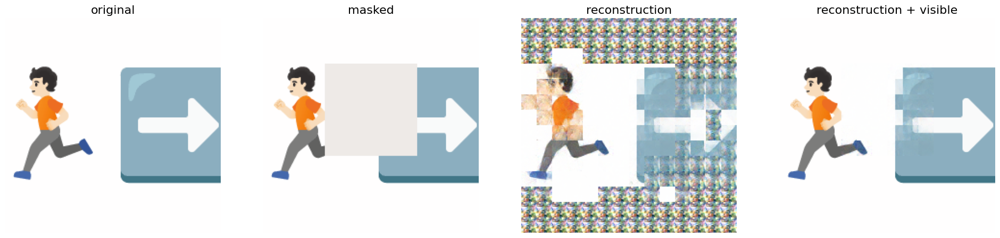

17
run regular


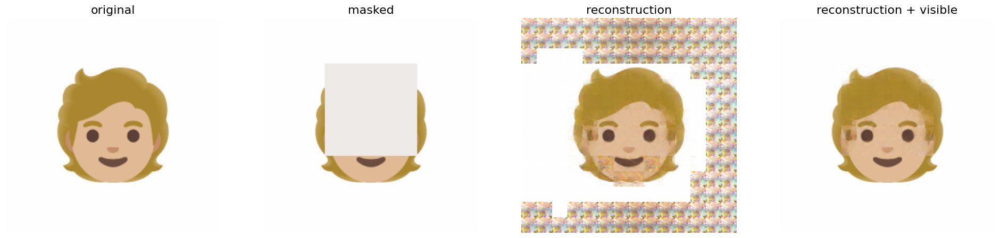

18
run regular


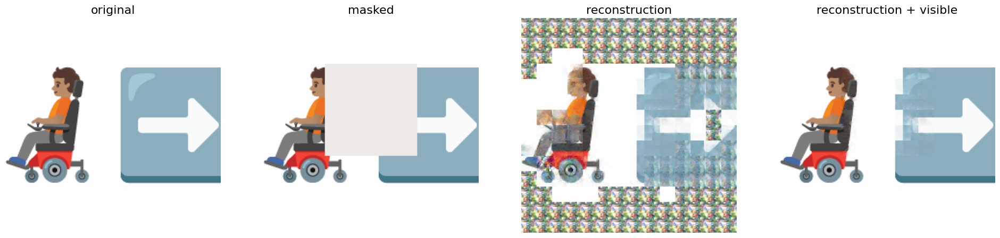

19
run regular


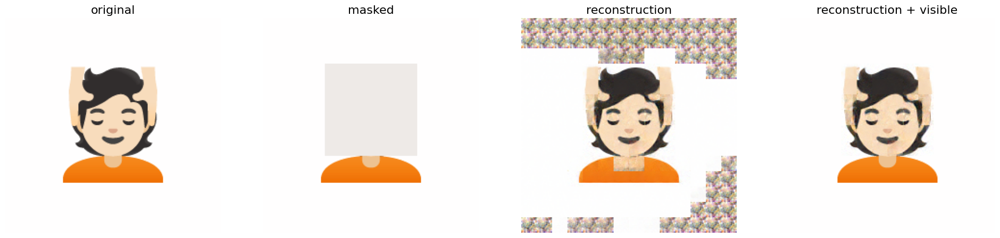

20
run regular


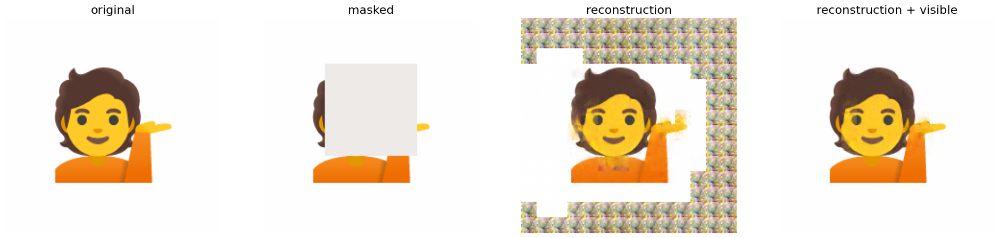

21
run regular


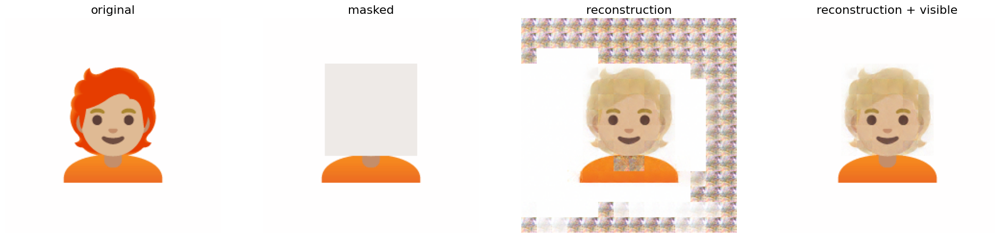

22
run regular


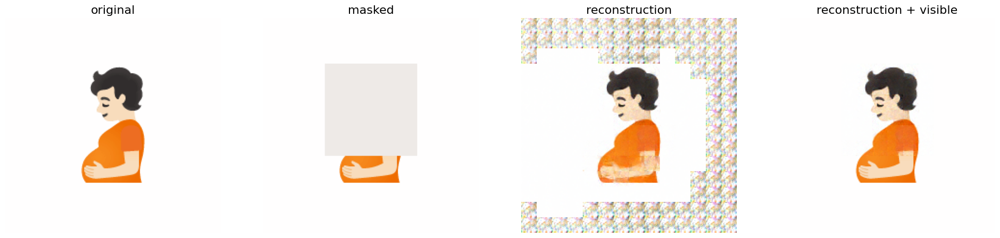

23
run regular


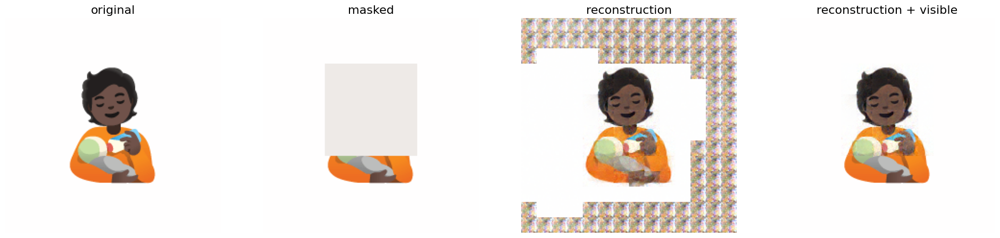

24
run regular


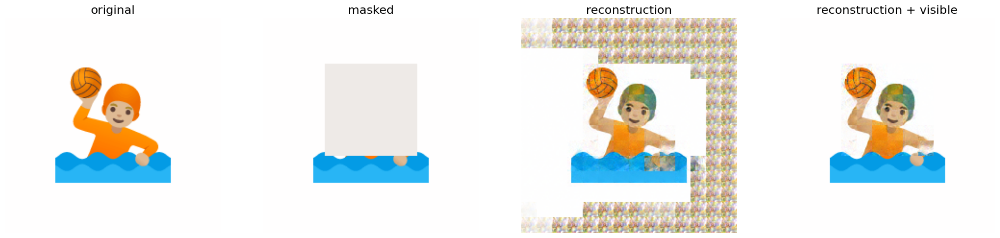

25
run regular


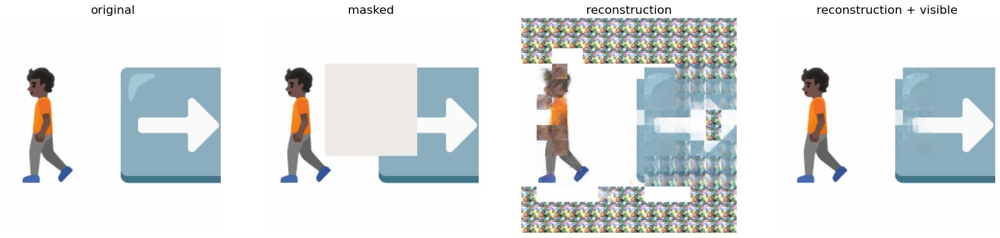

26
run regular


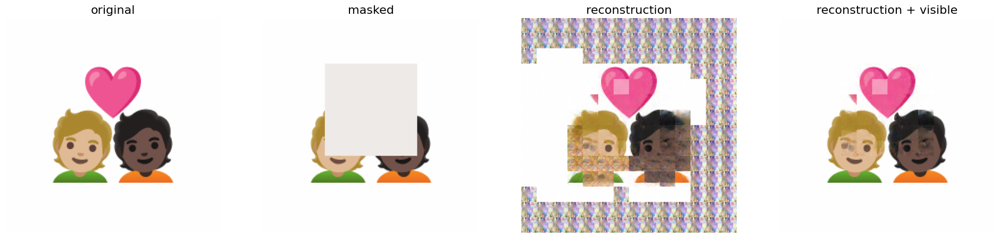

27
run regular


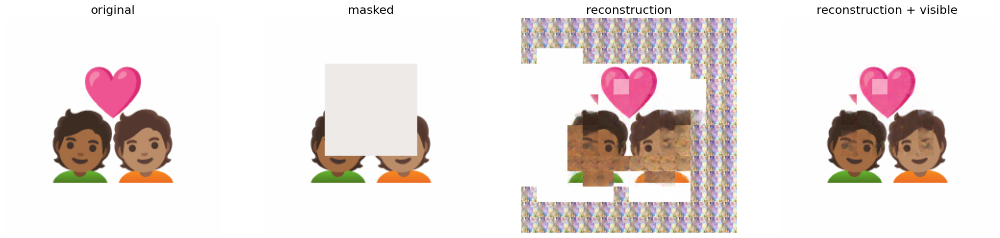

28
run regular


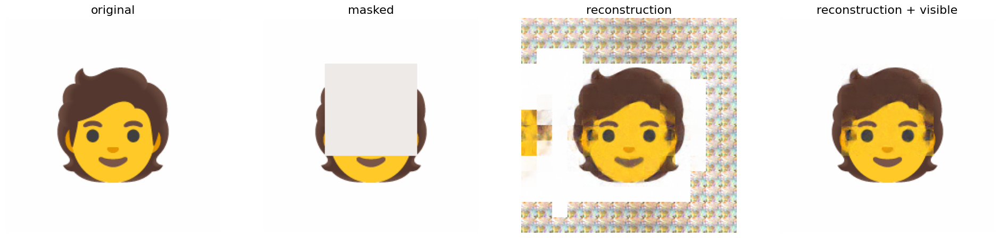

29
run regular


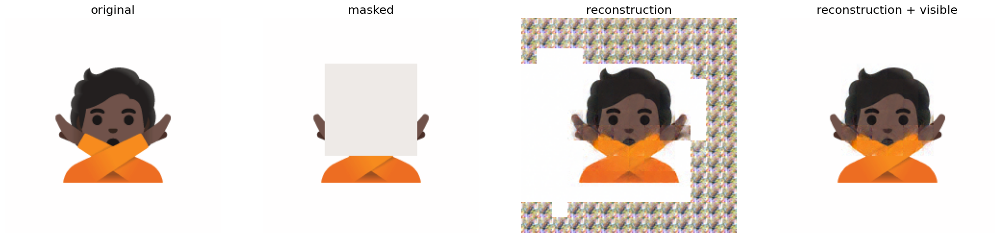

30
run regular


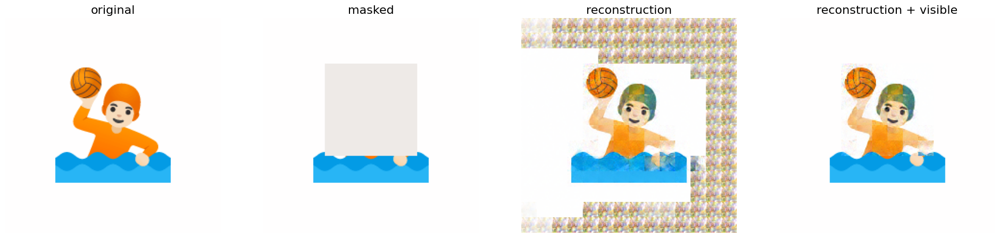

31
run regular


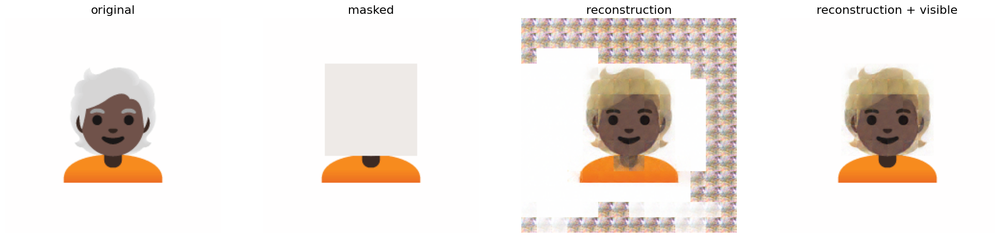

32
run regular


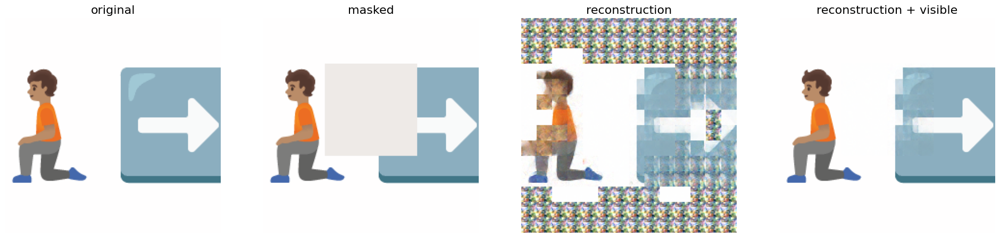

33
run regular


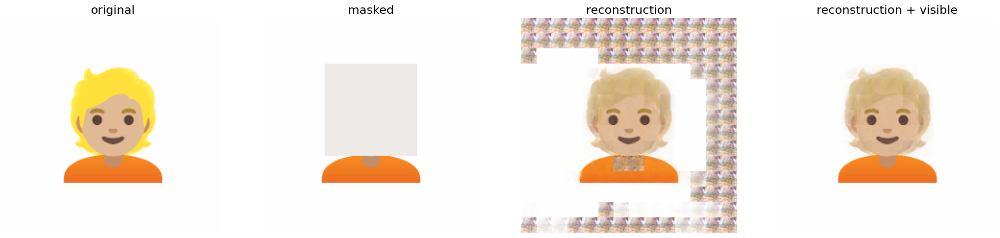

34
run regular


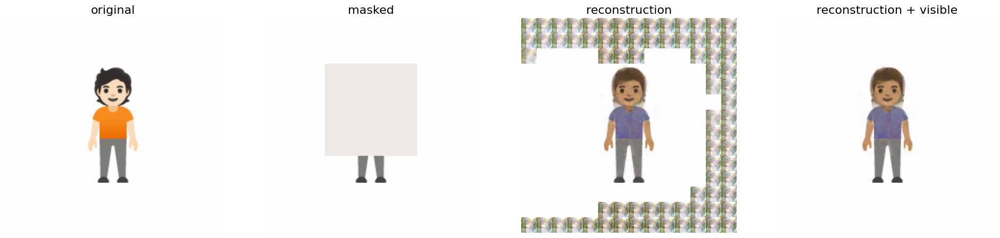

35
run regular


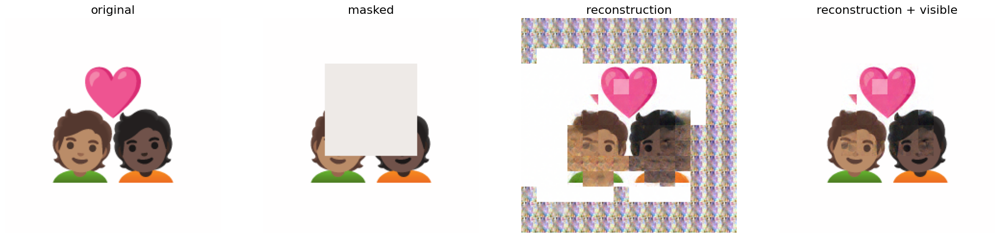

36
run regular


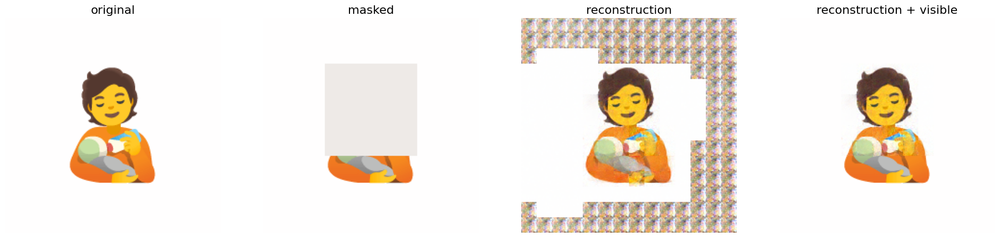

37
run regular


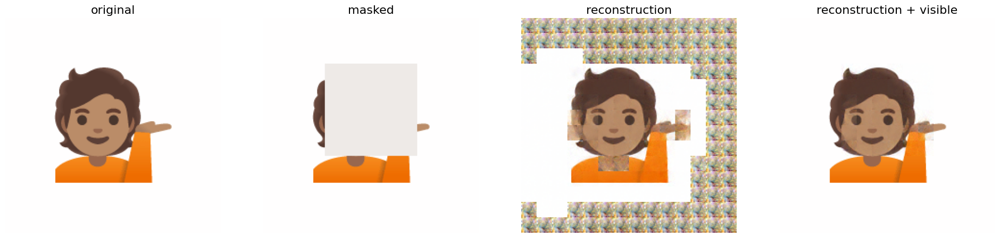

38
run regular


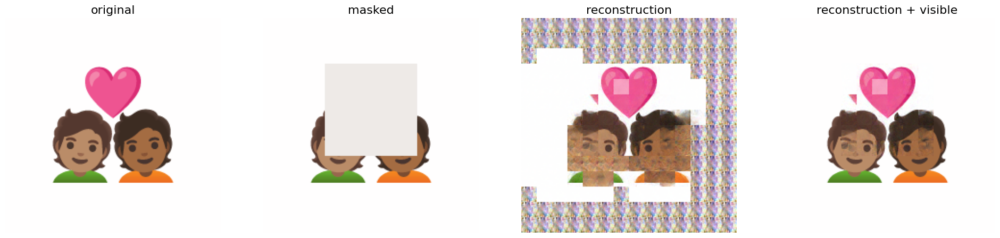

39
run regular


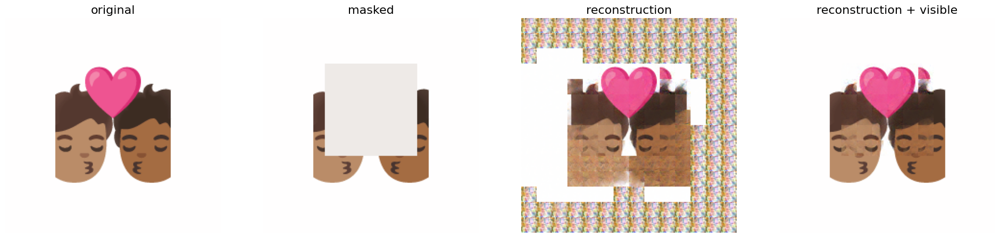

40
run regular


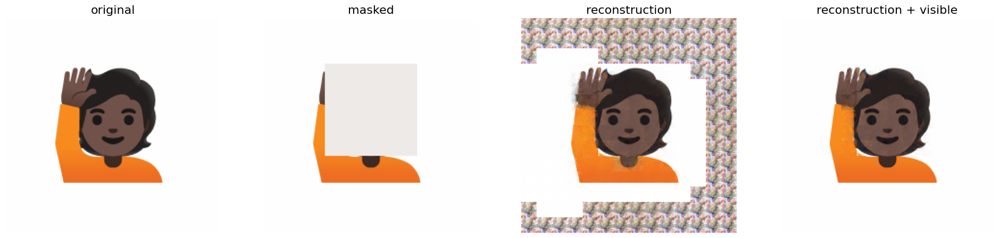

In [8]:
model_mae = model_mae.cuda()
# lower_model = lower_model.cuda()
# upper_model = upper_model.cuda() 
    
print(model_mae)
for idx, img_tuple in enumerate(test_loader):
    print(idx)
    plt.rcParams['figure.figsize'] = [5, 5]
    img, label = img_tuple
    assert img.shape == (1, 3, 224, 224)
    img = img.cuda()
    img = img.squeeze()
    #show_image(torch.einsum('chw->hwc', img))

    torch.manual_seed(0)
    #print('MAE with pixel reconstruction:')
    mask_layout = torch.ones(14, 14).to(device=img.device)
    #print(mask_layout.shape)
    mask_layout[3:9, 4:10] = 0
    mask_layout = mask_layout.flatten()
    #print(mask_layout)
    keep_indices = torch.where(mask_layout == 1)[0]
    restore_indices = torch.where(mask_layout == 0)[0]
    keep_indices = keep_indices.reshape(1, -1)
    restore_indices = restore_indices.reshape(1, -1)
    ids_shuffle = torch.cat((keep_indices, restore_indices), dim=1)
    print('run regular')
    # run_one_image(img, model_mae, mask_ratio=0.75)
    #print('force the mask wearing')
    #print('keep indices shape', keep_indices.shape)
    #print('restore indices shape', restore_indices.shape)
    #print('current keep indices:', keep_indices)
    mask_ratio = 1 - keep_indices.shape[1] / ids_shuffle.shape[1] - 0.001
    #print('mask ratio:', mask_ratio)
    run_one_image(img, model_mae, mask_ratio=mask_ratio, force_mask=ids_shuffle)
    # print('Lower bound:')
    # run_one_image(img, lower_model, mask_ratio=0.75)
    # print('Upper bound:')
    # run_one_image(img, upper_model, mask_ratio=0.75)
    
    if idx == 40:
        break